# An analysis of the hospitals in the US

## Author : Ramya Pozhath


Two datasets are used in this analysis, both are taken from Kaggle.com

DatasetA :
This dataset contains information about 7596 hospitals in the US, including latitude, longitude, staff, beds, ownership, among others. All records were extracted from the U.S. Department of Homeland Security. Link is given below,

https://www.kaggle.com/datasets/andrewmvd/us-hospital-locations





DatasetB :
This file contains general information about all hospitals (4812 entries) that have been registered with Medicare, including their addresses, type of hospital, and ownership structure. It also contains information about the quality of each hospital, in the form of an overall rating (1-5, where 5 is the best possible rating & 1 is the worst), and whether the hospital scored above, same as, or below the national average for a variety of measures. The link is given below,

https://www.kaggle.com/datasets/cms/hospital-general-information?select=HospInfo.csv




In [12]:
# Import the Python modules needed for the analysis

In [13]:
import warnings
warnings.filterwarnings("ignore")

In [14]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import folium
import mpu
from uszipcode import SearchEngine
#import zipcodes
from IPython.display import display_html 
import seaborn as sns


In [15]:
# Lets start with the first dataset DatasetA. This includes all the hospitals in the US

In [16]:
# Loading the data and inspecting the columns
hospitals = pd.read_csv("us_hospital_locations.csv")
hospitals.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7596 entries, 0 to 7595
Data columns (total 34 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   X           7596 non-null   float64
 1   Y           7596 non-null   float64
 2   FID         7596 non-null   int64  
 3   ID          7596 non-null   int64  
 4   NAME        7596 non-null   object 
 5   ADDRESS     7596 non-null   object 
 6   CITY        7596 non-null   object 
 7   STATE       7596 non-null   object 
 8   ZIP         7596 non-null   int64  
 9   ZIP4        7596 non-null   object 
 10  TELEPHONE   7596 non-null   object 
 11  TYPE        7596 non-null   object 
 12  STATUS      7596 non-null   object 
 13  POPULATION  7596 non-null   int64  
 14  COUNTY      7596 non-null   object 
 15  COUNTYFIPS  7596 non-null   object 
 16  COUNTRY     7596 non-null   object 
 17  LATITUDE    7596 non-null   float64
 18  LONGITUDE   7596 non-null   float64
 19  NAICS_CODE  7596 non-null  

In [17]:
# We can see that there is a total 7596 hospitals in the dataset.

In [18]:
hospitals.head(3)

,X,Y,FID,ID,NAME,ADDRESS,CITY,STATE,ZIP,ZIP4,...,VAL_DATE,WEBSITE,STATE_ID,ALT_NAME,ST_FIPS,OWNER,TTL_STAFF,BEDS,TRAUMA,HELIPAD
0,-1.331889e+07,4.346975e+06,1,5793230,CENTRAL VALLEY GENERAL HOSPITAL,1025 NORTH DOUTY STREET,HANFORD,CA,93230,NOT AVAILABLE,...,2014/02/10 00:00:00,http://www.hanfordhealth.com,NOT AVAILABLE,NOT AVAILABLE,6,PROPRIETARY,-999,49,NOT AVAILABLE,N
1,-1.322651e+07,4.049626e+06,2,53391362,LOS ROBLES HOSPITAL & MEDICAL CENTER - EAST CA...,150 VIA MERIDA,WESTLAKE VILAGE,CA,91362,NOT AVAILABLE,...,2014/02/10 00:00:00,http://www.losrobleshospital.com,NOT AVAILABLE,NOT AVAILABLE,6,PROPRIETARY,-999,62,NOT AVAILABLE,N
2,-1.315620e+07,4.031978e+06,3,11190023,EAST LOS ANGELES DOCTORS HOSPITAL,4060 WHITTIER BOULEVARD,LOS ANGELES,CA,90023,NOT AVAILABLE,...,2014/02/10 00:00:00,http://www.elalax.com,NOT AVAILABLE,NOT AVAILABLE,6,PROPRIETARY,-999,127,NOT AVAILABLE,N


In [19]:
# Checking whether null values are present in any of the columns in the dataframe. It shows no null values in any columns

In [20]:
hospitals.isnull().sum()

X             0
Y             0
FID           0
ID            0
NAME          0
ADDRESS       0
CITY          0
STATE         0
ZIP           0
ZIP4          0
TELEPHONE     0
TYPE          0
STATUS        0
POPULATION    0
COUNTY        0
COUNTYFIPS    0
COUNTRY       0
LATITUDE      0
LONGITUDE     0
NAICS_CODE    0
NAICS_DESC    0
SOURCE        0
SOURCEDATE    0
VAL_METHOD    0
VAL_DATE      0
WEBSITE       0
STATE_ID      0
ALT_NAME      0
ST_FIPS       0
OWNER         0
TTL_STAFF     0
BEDS          0
TRAUMA        0
HELIPAD       0
dtype: int64

In [21]:
# Replacing the cells with values -999 in the columns 'POPULATION' and 'BEDS', with np.nan values

In [22]:
hospitals.loc[hospitals['POPULATION']== -999 , 'POPULATION'] = np.nan

In [23]:
hospitals.loc[hospitals['BEDS']== -999, 'BEDS'] = np.nan

In [24]:
# Lets find out how many hospitals have helipads.
# Below we can see that 4177 out of 7596 hospitals have helipads.

# ie., around 55 % US hospitals have helipads. 
hospitals["HELIPAD"].value_counts()

Y    4177
N    3419
Name: HELIPAD, dtype: int64

In [25]:
# Lets make some plots.

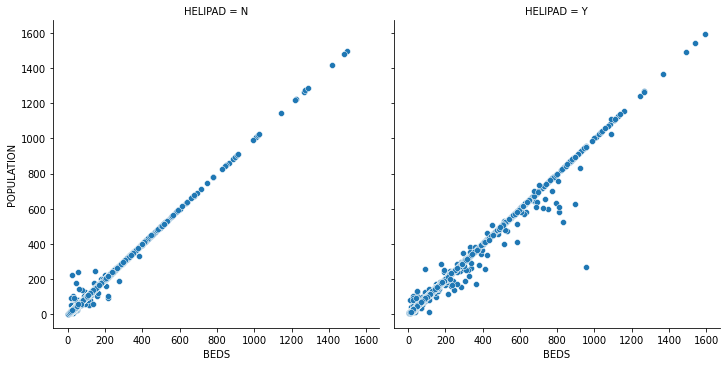

In [26]:
# Scatter plots between number of beds and population in the hospitals, with and without helipad
sns.relplot(data=hospitals, x='BEDS', y='POPULATION', col='HELIPAD')



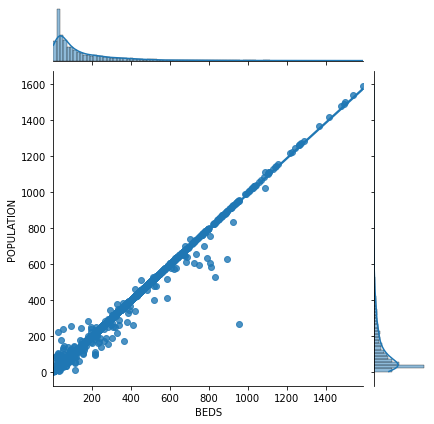

In [27]:
# A jointplot comparing the distributions of BEDS and POPULATION in the hospitals

sns.jointplot(x='BEDS', y='POPULATION', data=hospitals, kind='reg')

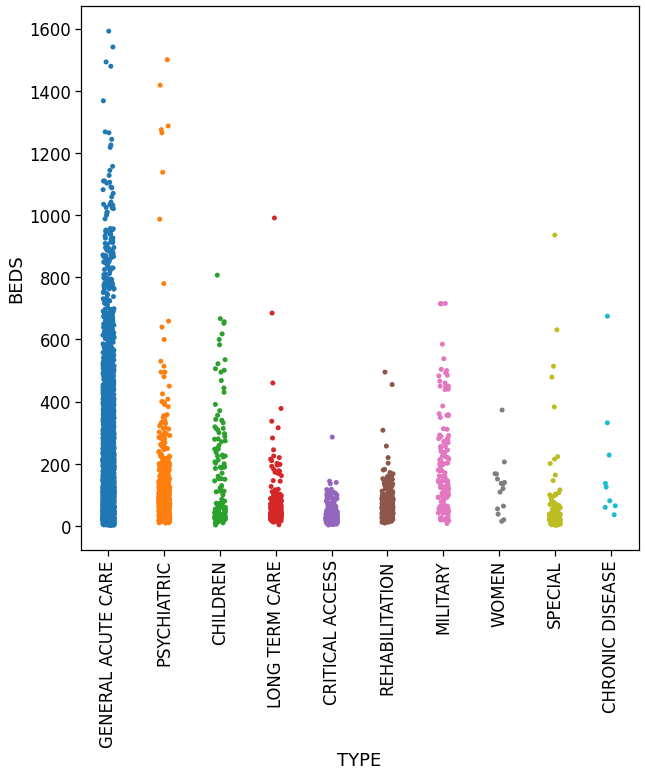

In [28]:
# Strip plot showing the number beds for the different types of hospitals

plt.figure(figsize=(10, 10))
sns.set_context('notebook', font_scale=1.5)
g = sns.stripplot(data=hospitals, x='TYPE', y='BEDS')  ;
for item in g.get_xticklabels():
    item.set_rotation(90)


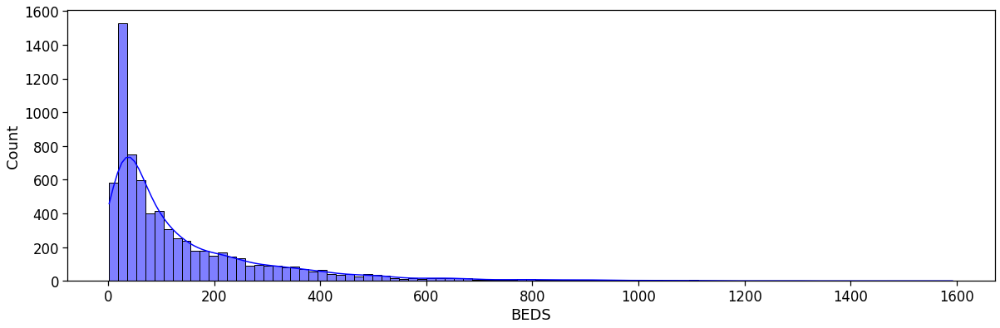

In [29]:
# Histogram of the number of beds in the hospitals, with a kde (Kernel Density Plot) plot on it.

plt.figure(figsize=(20,6))
ax = sns.histplot(data=hospitals, x='BEDS', kde=True,color='blue')

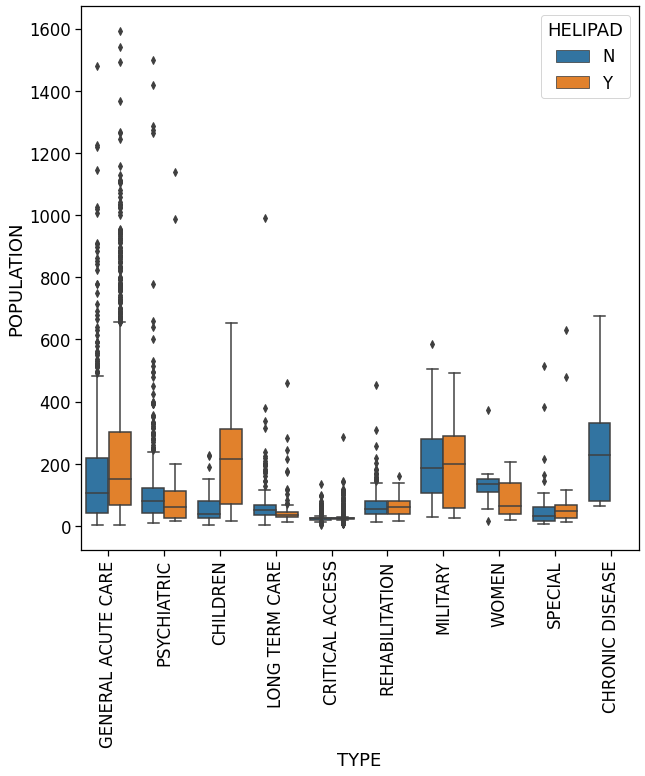

In [30]:
# Boxplots showing the Poulation distribution for different types of hospitals, with and without helipads.

plt.figure(figsize=(10, 10))
sns.set_context('notebook', font_scale=1.5)

g = sns.boxplot(data=hospitals, x="TYPE", y="POPULATION", hue="HELIPAD")

for item in g.get_xticklabels():
    item.set_rotation(90)

In [31]:
# creating the correlation table between number of beds and population of the hospitals

c= hospitals[['BEDS', 'POPULATION']]
d = c.corr()
d

,BEDS,POPULATION
BEDS,1.000000,0.996725
POPULATION,0.996725,1.000000


<AxesSubplot:>

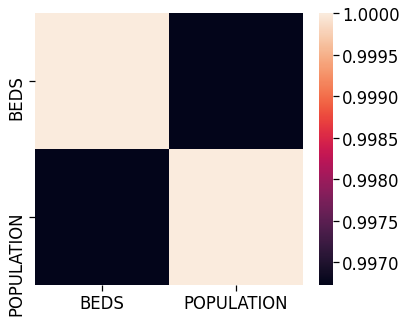

In [32]:
# plotting the heatmap

plt.figure(figsize=(6,5))
sns.heatmap(d, cbar=1)

In [33]:
# Below table gives the hospital types by number and their relative percentages


hosp_type= hospitals[["TYPE"]].value_counts().to_frame().reset_index().rename(columns= {"TYPE" :"Hospital Type", 0 : "Total number of Hospitals"})
hosp_type["Percentage(%)"] = round(hosp_type["Total number of Hospitals"]/hosp_type["Total number of Hospitals"].sum()*100, 2)
hosp_type

,Hospital Type,Total number of Hospitals,Percentage(%)
0,GENERAL ACUTE CARE,4481,58.99
1,CRITICAL ACCESS,1027,13.52
2,PSYCHIATRIC,759,9.99
3,LONG TERM CARE,431,5.67
4,REHABILITATION,378,4.98
5,MILITARY,216,2.84
6,SPECIAL,145,1.91
7,CHILDREN,130,1.71
8,WOMEN,20,0.26
9,CHRONIC DISEASE,9,0.12


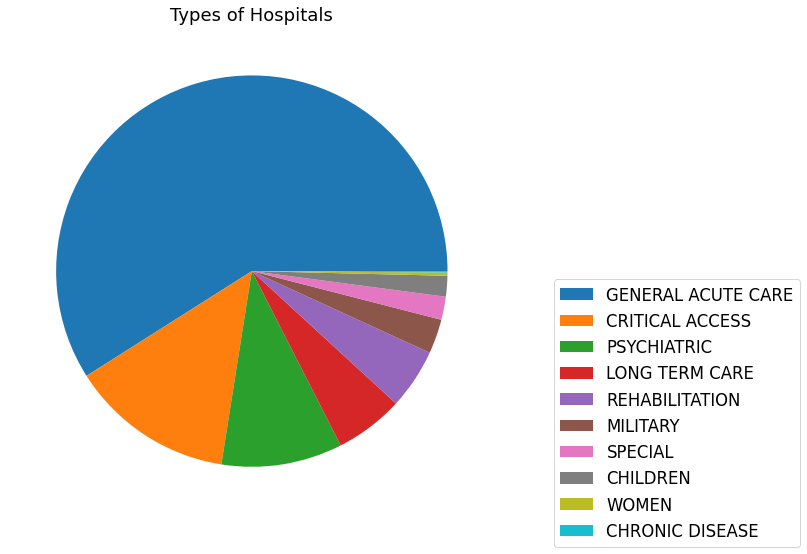

In [34]:
plt.figure(figsize=(9,9))
#plt.pie(hosp_type["Total number of Hospitals"],labels=hosp_type["Hospital Type"],textprops={'fontsize': 10} );
pie = plt.pie(hosp_type["Total number of Hospitals"])
plt.gca().set_title('Types of Hospitals')
plt.legend(labels=hosp_type["Hospital Type"],bbox_to_anchor=(1.1,0.5))


In [35]:
# Below table give Hospital Ownership by number of Hospitals


hosp_owner = hospitals[["OWNER"]].value_counts().to_frame().reset_index().rename(columns= {"OWNER": "Owner", 0 : "Total number of Hospitals"})       
hosp_owner["Percentage(%)"] = round(hosp_owner["Total number of Hospitals"]/hosp_owner["Total number of Hospitals"].sum()*100, 2)
hosp_owner

,Owner,Total number of Hospitals,Percentage(%)
0,NON-PROFIT,3515,46.27
1,PROPRIETARY,2076,27.33
2,GOVERNMENT - DISTRICT/AUTHORITY,517,6.81
3,GOVERNMENT - LOCAL,502,6.61
4,NOT AVAILABLE,428,5.63
5,GOVERNMENT - STATE,290,3.82
6,GOVERNMENT - FEDERAL,266,3.50
7,LIMITED LIABILITY COMPANY,2,0.03


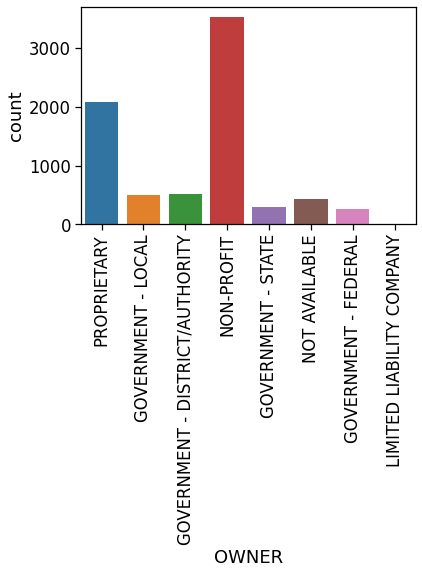

In [36]:
# Countplot showing the number of occurences of each ownership types
g = sns.countplot(x='OWNER',data=hospitals)
for item in g.get_xticklabels():
    item.set_rotation(90)


In [37]:
# making a crosstable between the TYPE and OWNER of the hospitals with the frequencies


#  hosp_sub1 = hospitals.groupby(['TYPE','OWNER'])['ID'].count().unstack().fillna(0)
hosp_sub1 = pd.crosstab(hospitals['TYPE'], hospitals['OWNER'])  # fill_value= 0 by default
hosp_sub1

OWNER,GOVERNMENT - DISTRICT/AUTHORITY,GOVERNMENT - FEDERAL,GOVERNMENT - LOCAL,GOVERNMENT - STATE,LIMITED LIABILITY COMPANY,NON-PROFIT,NOT AVAILABLE,PROPRIETARY
TYPE,,,,,,,,
CHILDREN,1,0,0,4,0,93,17,15
CHRONIC DISEASE,0,0,0,3,0,5,1,0
CRITICAL ACCESS,171,33,209,3,0,518,45,48
GENERAL ACUTE CARE,334,18,258,93,0,2555,220,1003
LONG TERM CARE,3,0,4,5,0,62,25,332
MILITARY,0,213,0,0,0,0,3,0
PSYCHIATRIC,4,1,28,169,2,141,73,341
REHABILITATION,3,1,1,6,0,103,29,235
SPECIAL,1,0,2,7,0,27,15,93


In [38]:
# The above tables can be visualized as a stacked histogram as given below. 

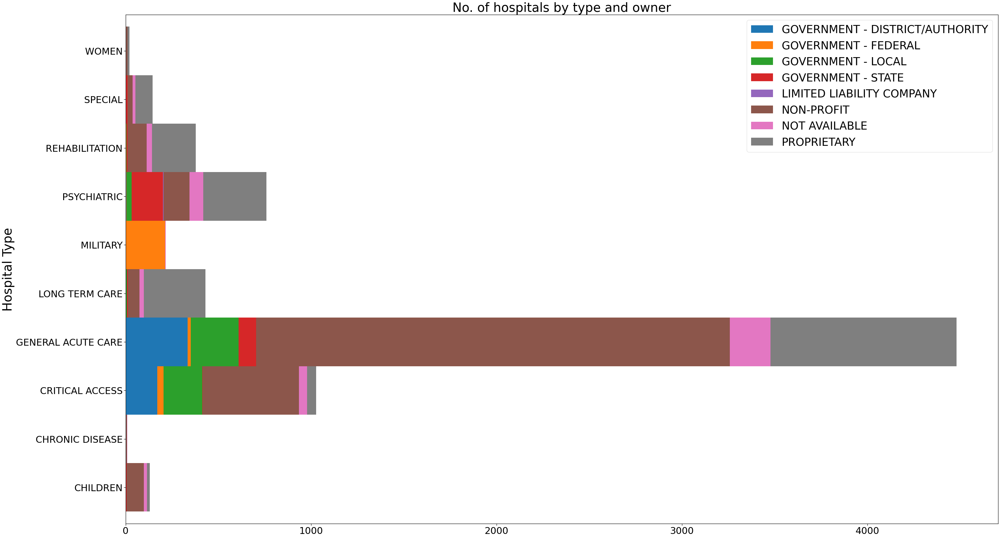

In [82]:
hosp_sub1.plot.barh(stacked=True, width = 1)
plt.title("No. of hospitals by type and owner", fontsize=40)
plt.ylabel("Hospital Type", fontsize=40)
plt.legend(loc= 'upper right', fontsize=35)
plt.rcParams['figure.figsize'] = [50, 30]
#spacing = 0.100
#plt.subplots_adjust(bottom=spacing)
plt.yticks(fontsize=30) ;
plt.xticks(fontsize=30) ;


In [40]:
# Lets make a Choropleth map - displaying the number of hospitals in each state with a color coding

In [41]:
#  Here we are downloading USA states geo JSON which has polygon for each states of US.
url = 'https://raw.githubusercontent.com/python-visualization/folium/master/examples/data'
state_geo = f'{url}/us-states.json'

In [42]:
# No. of Hospitals in eaxh state.
hosps_num_by_state = hospitals.groupby(["STATE"]).size().reset_index().rename(columns={0: "No. of Hospitals"}).sort_values('No. of Hospitals', ascending=False)
hosps_num_by_state

,STATE,No. of Hospitals
48,TX,805
5,CA,565
10,FL,352
38,OH,294
41,PA,278
37,NY,275
20,LA,256
16,IL,225
11,GA,222
17,IN,191


In [44]:
# getting  mean values for latitude and longitude from the data
mean_lat= hospitals['LATITUDE'].mean()
mean_long = hospitals['LONGITUDE'].mean()

# plotting the map
m = folium.Map(location=[mean_lat, mean_long], zoom_start=3)
folium.Choropleth(
    geo_data=state_geo,
    name='choropleth',
    data=hosps_num_by_state,
    columns=['STATE', 'No. of Hospitals'],
    key_on='feature.id',
    fill_color='YlGn',
    fill_opacity=0.9,
    line_opacity=0.2,
    legend_name='Hospital Count'
).add_to(m)       
folium.LayerControl().add_to(m)

m

In [45]:
# Putting all the hospitals on a webmap

In [46]:
# Plotting the webmap

hosp_map = folium.Map(location=[mean_lat, mean_long], zoom_start=4, tiles="Stamen Terrain")


hospitals.apply(lambda row: folium.Circle(location=[row['LATITUDE'],row['LONGITUDE']], color="red").add_to(hosp_map), axis=1)

heli_hosp = hospitals[hospitals["HELIPAD"] == "Y"]
heli_hosp.apply(lambda row: folium.Circle(location=[row['LATITUDE'],row['LONGITUDE']], color="blue").add_to(hosp_map), axis=1)


hosp_map

In [47]:
# In the above map, blue dots are hospitals with helipad and red ones are without helipad.

In [48]:
# Now lets find out how many hospitals are there near my location.

In [49]:
# Given my zipcode (any zipcode in the US) lets find out all the hospitals within 25 miles of this zipcode

In [50]:
# function to calculate the latitude and longitude from a given zipcode in the US



def get_my_location(zip_code):
    search = SearchEngine()
    try:
        lat = search.by_zipcode(str(zip_code)).lat
        long = search.by_zipcode(str(zip_code)).lng
        # print(zip_code,lat,long)
        return (lat,long) 
    except:
        print(zip_code, "is not in the database, returning (-999, -999) as the output")
        return (-999,-999)



In [51]:
# Enter valid 5 -digit zip code of your location below. (This line can be coded as a user input)

MY_ZIPCODE = 92126




In [52]:
# here we calculate the location coordinates of my entered zipcode. 
MY_LOC = get_my_location(MY_ZIPCODE)
print(MY_LOC)


(32.88, -117.13)


In [53]:
# this function calculates the distance in miles between my location and another location

def dist_in_miles(row, zip_code=MY_ZIPCODE):
    result = mpu.haversine_distance((row['LATITUDE'],row['LONGITUDE']),get_my_location(zip_code))
    return result * 0.62137119


In [54]:
# calculate the distance (in miles) of each hospital in the dataset from my location
dist_from_my_loc = hospitals.apply(dist_in_miles, axis=1)
dist_from_my_loc

0        278.342115
1        131.103823
2         99.682711
3        108.658370
4         94.925289
           ...     
7591    2267.762408
7592     455.477484
7593    2492.041776
7594    2289.375258
7595     617.743861
Length: 7596, dtype: float64

In [55]:
col_list = ['NAME', "ADDRESS", "ZIP", "CITY", "COUNTY", "STATE", "TYPE", "OWNER", "BEDS", "HELIPAD","LATITUDE", "LONGITUDE"]

# extracting hospitals within 25 miles from my location
hosps_near_me = hospitals.loc[(dist_from_my_loc <= 25), col_list].set_index("NAME")


# below are the hospitals within 25 miles of my location
hosps_near_me

,ADDRESS,ZIP,CITY,COUNTY,STATE,TYPE,OWNER,BEDS,HELIPAD,LATITUDE,LONGITUDE
NAME,,,,,,,,,,,
KAISER FND HOSP - SAN DIEGO,4647 ZION AVENUE,92120,SAN DIEGO,SAN DIEGO,CA,GENERAL ACUTE CARE,NON-PROFIT,414.0,N,32.791563,-117.095160
SCRIPPS GREEN HOSPITAL,10666 NORTH TORREY PINES ROAD,92037,LA JOLLA,SAN DIEGO,CA,GENERAL ACUTE CARE,NON-PROFIT,173.0,N,32.896859,-117.242871
SCRIPPS MEMORIAL HOSPITAL - ENCINITAS,354 SANTA FE DRIVE,92024,ENCINITAS,SAN DIEGO,CA,GENERAL ACUTE CARE,NON-PROFIT,194.0,Y,33.037345,-117.284183
SHARP MARY BIRCH HOSPITAL FOR WOMEN AND NEWBORNS,3003 HEALTH CENTER DRIVE,92123,SAN DIEGO,SAN DIEGO,CA,WOMEN,NON-PROFIT,206.0,Y,32.798296,-117.154978
UC SAN DIEGO HEALTH HILLCREST - HILLCREST MEDICAL CENTER,200 WEST ARBOR DRIVE,92103,SAN DIEGO,SAN DIEGO,CA,GENERAL ACUTE CARE,NON-PROFIT,390.0,Y,32.754770,-117.165731
EDGEMOOR GERIATRIC HOSPITAL,655 PARK CENTER DRIVE,92071,SANTEE,SAN DIEGO,CA,PSYCHIATRIC,GOVERNMENT - LOCAL,192.0,N,32.852345,-116.974114
ALVARADO HOSPITAL MEDICAL CENTER,6655 ALVARADO ROAD,92120,SAN DIEGO,SAN DIEGO,CA,GENERAL ACUTE CARE,PROPRIETARY,226.0,N,32.776586,-117.057065
ALVARADO PARKWAY INSTITUTE B.H.S.,7050 PARKWAY DRIVE,91942,LA MESA,SAN DIEGO,CA,PSYCHIATRIC,PROPRIETARY,66.0,N,32.774632,-117.044162
KINDRED HOSPITAL - SAN DIEGO,1940 EL CAJON BOULEVARD,92104,SAN DIEGO,SAN DIEGO,CA,GENERAL ACUTE CARE,PROPRIETARY,70.0,N,32.756384,-117.144645


In [56]:
len(hosps_near_me) 

# We can see that there are 35 hospitals near my location, within 25 miles



35

In [57]:
# Lets mark these 35 hospitals on the webmap

In [58]:
hosps_near_me_map = folium.Map(location=MY_LOC, zoom_start=10, tiles="Stamen Terrain")

hosps_near_me.apply(lambda row:folium.Marker(
        location=[row['LATITUDE'],row['LONGITUDE']],
        rotation=0,color="red",
        popup= row.index.values,
        tooltip = row["ADDRESS"],
        opacity =0.8,
            icon=folium.Icon(icon='info-sign', color="red"),
        ).add_to(hosps_near_me_map), axis=1)

hosps_near_me.apply(lambda row:folium.RegularPolygonMarker(location=MY_LOC,
                                            rotation=0,color="yellow",fill_color="white",
                                             radius = 15,
                                             popup= "MY ZIPCODE = "+ str(MY_ZIPCODE),
                                            tooltip = "MY LOCATION",
                                            opacity = 0.8,
                                            fill_opacity =1
                   ).add_to(hosps_near_me_map), axis=1)

hosps_near_me_map

In [59]:
# In the above map, the yellow diamond marks my location

In [60]:
# Lets find out the types of hospitals near my location

In [61]:
hosps_near_me.groupby(["TYPE"]).size().to_frame().reset_index().sort_values([0], ascending=False).rename(columns={'TYPE':'Hospital Type',0:'No. of Hospitals'})

# In the below table , we can see that I have 24 General Acute care hospitals near me

,Hospital Type,No. of Hospitals
1,GENERAL ACUTE CARE,24
4,PSYCHIATRIC,5
3,MILITARY,2
0,CHILDREN,1
2,LONG TERM CARE,1
5,REHABILITATION,1
6,WOMEN,1


In [62]:
# At this point let's bring the second dataset datasetB into our analysis.
# datasetB has all the hospitals registered with the medicare. Hence it is a subset of datasetA

In [63]:
# loading the datasetB, inspecting its columns

medicare_hospitals = pd.read_csv("HospInfo.csv")
medicare_hospitals.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4812 entries, 0 to 4811
Data columns (total 29 columns):
 #   Column                                                         Non-Null Count  Dtype 
---  ------                                                         --------------  ----- 
 0   Provider ID                                                    4812 non-null   int64 
 1   Hospital Name                                                  4812 non-null   object
 2   Address                                                        4812 non-null   object
 3   City                                                           4812 non-null   object
 4   State                                                          4812 non-null   object
 5   ZIP Code                                                       4812 non-null   int64 
 6   County Name                                                    4797 non-null   object
 7   Phone Number                                                   4812 n

In [64]:
# This dataset has 4812 hospitals. ie., 4812 hospitals out of 7596 are registered with medicare. 
# ie., around 63 % hospitals in the US are registered with medicare and medicaid.


In [65]:
# Now, I would like to see, whether the 35 hospitals near me are registered with medicare or not.
# Note that datasetA and datasetB cannot be merged, as there are no exactly matching common columns like hospital ID etc.
# The hospital names, address are strings and are written in slightly different ways in the two datasets, hence 
# searching the 35 hospitals in datasetB using names/address are not a proper way as we may miss out some.

# So, let's find out hospitals near me, registered with medicare, from datasetB, in the same way as described above, 
# by finding distances of each hospital from my location. For this we use latitude-longitude coordinates of the hospitals, 
# and those of my location.



In [66]:
# But datasetB doesn't have the latitude and longitude coordinates of the hospitals.


# Here, we calculate these coordinates for these hospitals and put them in two columns - "LATITUDE" and "LONGITUDE"
coordinates = medicare_hospitals["ZIP Code"].apply(get_my_location)
medicare_hospitals["LATITUDE"] = coordinates.str[0]
medicare_hospitals["LONGITUDE"] = coordinates.str[1]


In [67]:
# Here we calculate the distances of each hospital from my location using the latitude-longitude coordinates
medicare_dist_from_my_loc = medicare_hospitals.apply(dist_in_miles, axis=1)
medicare_dist_from_my_loc

0       1779.599027
1       1800.520823
2       1825.269641
3       1710.172884
4       1753.009548
           ...     
4807    1319.213529
4808    1728.716922
4809    2068.051472
4810    1989.980124
4811    2001.759715
Length: 4812, dtype: float64

In [68]:
# list of columns needed for further analysis
medicare_col_list = ["Hospital Name","Address","ZIP Code","City","County Name","State","Hospital Type",
                     "Hospital Ownership","Hospital overall rating", "LATITUDE", "LONGITUDE"]

# Extracting hospitals within 25 miles of my location
medicare_hosps_near_me = medicare_hospitals.loc[(medicare_dist_from_my_loc <= 25), medicare_col_list] # .set_index("Hospital Name")

# Below are the medicare hospitals within 25 miles of my location.  
medicare_hosps_near_me

,Hospital Name,Address,ZIP Code,City,County Name,State,Hospital Type,Hospital Ownership,Hospital overall rating,LATITUDE,LONGITUDE
590,TRI-CITY MEDICAL CENTER,4002 VISTA WAY,92056,OCEANSIDE,SAN DIEGO,CA,Acute Care Hospitals,Government - Hospital District or Authority,2,33.20,-117.29
599,SCRIPPS MERCY HOSPITAL,4077 5TH AVE,92103,SAN DIEGO,SAN DIEGO,CA,Acute Care Hospitals,Voluntary non-profit - Private,3,32.74,-117.17
618,KAISER FOUNDATION HOSPITAL - SAN DIEGO,4647 ZION AVE,92120,SAN DIEGO,SAN DIEGO,CA,Acute Care Hospitals,Voluntary non-profit - Other,3,32.79,-117.06
631,SHARP CHULA VISTA MEDICAL CENTER,751 MEDICAL CENTER COURT,91911,CHULA VISTA,SAN DIEGO,CA,Acute Care Hospitals,Proprietary,4,32.61,-117.03
660,PARADISE VALLEY HOSPITAL,2400 EAST 4TH ST,91950,NATIONAL CITY,SAN DIEGO,CA,Acute Care Hospitals,Proprietary,3,32.67,-117.09
675,RADY CHILDREN'S HOSPITAL - SAN DIEGO,3020 CHILDRENS WAY,92123,SAN DIEGO,SAN DIEGO,CA,Childrens,Voluntary non-profit - Other,Not Available,32.80,-117.13
726,SCRIPPS GREEN HOSPITAL,10666 NORTH TORREY PINES ROAD,92037,LA JOLLA,SAN DIEGO,CA,Acute Care Hospitals,Voluntary non-profit - Private,5,32.86,-117.24
786,UC SAN DIEGO HEALTH HILLCREST - HILLCREST MED CTR,200 WEST ARBOR DRIVE,92103,SAN DIEGO,SAN DIEGO,CA,Acute Care Hospitals,Voluntary non-profit - Other,3,32.74,-117.17
793,SHARP CORONADO HOSPITAL AND HLTHCR CTR,250 PROSPECT PLACE,92118,CORONADO,SAN DIEGO,CA,Acute Care Hospitals,Proprietary,4,32.70,-117.21
801,SCRIPPS MEMORIAL HOSPITAL - ENCINITAS,354 SANTA FE DRIVE,92024,ENCINITAS,SAN DIEGO,CA,Acute Care Hospitals,Voluntary non-profit - Private,4,33.05,-117.25


In [69]:
print(len(medicare_hosps_near_me))

# We can see that, out of 35 hospitals near me, only 16 hospitals are registered with medicare.



16


In [70]:
# From the below table, we can see that out of 16 hospitals 15 are Acute Care hospitals and 1 is Children Hospital

medicare_hosps_near_me.groupby(['Hospital Type']).size().to_frame().reset_index().rename(columns={0:"No. of Hospitals"})

,Hospital Type,No. of Hospitals
0,Acute Care Hospitals,15
1,Childrens,1


In [71]:
# Below, we display all the hospitals and those registered with medicare within 25 miles of my location, side by side

df1_styler = hosps_near_me.reset_index()["NAME"].to_frame().style.set_table_attributes("style='display:inline'").set_caption('All the hospitals within 25 miles')
df2_styler = medicare_hosps_near_me["Hospital Name"].to_frame().rename(columns={"Hospital Name": "NAME"}).reset_index(drop=True).style.set_table_attributes("style='display:inline'").set_caption('Hospitals registered with medicare, within 25 miles')
display_html(df1_styler._repr_html_()+df2_styler._repr_html_(), raw=True)


,NAME
0,KAISER FND HOSP - SAN DIEGO
1,SCRIPPS GREEN HOSPITAL
2,SCRIPPS MEMORIAL HOSPITAL - ENCINITAS
3,SHARP MARY BIRCH HOSPITAL FOR WOMEN AND NEWBORNS
4,UC SAN DIEGO HEALTH HILLCREST - HILLCREST MEDICAL CENTER
5,EDGEMOOR GERIATRIC HOSPITAL
6,ALVARADO HOSPITAL MEDICAL CENTER
7,ALVARADO PARKWAY INSTITUTE B.H.S.
8,KINDRED HOSPITAL - SAN DIEGO
9,PARADISE VALLEY HOSPITAL


In [72]:

# For hospitals registered with medicare, there is a rating provided (1-5).
# Rating value of 5 corresponds to best performance and rating of 1 is the worst


# Let's see where my 16 nearby hospitals stand in terms of ratings. 


In [81]:
# Rating table is given below. 

rating_table = medicare_hosps_near_me[["Hospital Type","Hospital overall rating"]].value_counts().to_frame().reset_index().rename(columns={0 : "No. of hospitals"}).sort_values(by='Hospital overall rating')
rating_table['Hospital overall rating']= rating_table['Hospital overall rating'].apply(lambda x: x+" Stars" if len(x)==1 else x)
rating_table

,Hospital Type,Hospital overall rating,No. of hospitals
3,Acute Care Hospitals,2 Stars,1
0,Acute Care Hospitals,3 Stars,8
1,Acute Care Hospitals,4 Stars,4
2,Acute Care Hospitals,5 Stars,2
4,Childrens,Not Available,1
